In [1]:
#Load some basic packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid")

import random
random.seed(808)

import os
print(os.listdir("../reportr_part1_revised"))

import warnings
warnings.filterwarnings("ignore")

['Models_focal.ipynb', 'df_model_fsc.csv', '.DS_Store', 'Models_focal_sc.ipynb', 'png', 'Variable_focal.ipynb', 'df_model.csv', 'rating_sc0801.csv', 'df_model_sc.csv', '.ipynb_checkpoints', 'X_tmp_focal.csv', 'X_tmp_sc.csv', 'Models_sc.ipynb', 'Variable_sc.ipynb']


In [2]:
df = pd.read_csv('rating_sc0801.csv')
df.head()

,rdate,gvkey,n_gvkey,datadate,fyear,indfmt,consol,popsrc,datafmt,tic,...,s_x_Depreciation1_indadj1_5yd,s_x_Depreciation1_indadj2_5yd,s_x_RD_indadj1_5yd,s_x_RD_indadj2_5yd,s_x_Inv_act_indadj1_5yd,s_x_Inv_act_indadj2_5yd,b10ret,b1ret,t90ret,SP500Ret
0,08jan2003,6867,6867,31dec2002,2002,INDL,C,D,STD,MDU,...,-0.002023,-0.038094,0.000000,0.000000,-0.164159,-0.758758,0.012778,0.01468,0.011604,0.263804
1,15jan2003,8113,8113,31dec2002,2002,INDL,C,D,STD,OGE,...,-0.032450,-0.423750,-0.354714,-0.499166,-0.049852,-0.218858,0.012778,0.01468,0.011604,0.263804
2,17jan2003,11191,11191,31dec2002,2002,INDL,C,D,STD,VSH,...,0.000358,0.013690,0.000149,0.000144,0.042067,0.141314,0.012778,0.01468,0.011604,0.263804
3,31jan2003,4093,4093,31dec2002,2002,INDL,C,D,STD,DUK,...,-0.006364,-0.062014,0.148128,0.159233,0.047477,0.184123,0.012778,0.01468,0.011604,0.263804
4,12feb2003,10581,10581,31dec2002,2002,INDL,C,D,STD,TKR,...,0.001292,0.018608,-0.001810,-0.002357,-0.046959,-0.206060,0.012778,0.01468,0.011604,0.263804


In [3]:
# Define the rating code group.
for i in range(0, df.shape[0]):
    if df.ix[i, 'rating_code'] >=15:
        df.ix[i, 'rgroup_code'] = 4
    elif df.ix[i, 'rating_code'] >=12 and df.ix[i, 'rating_code'] <15:
        df.ix[i, 'rgroup_code'] = 3
    elif df.ix[i, 'rating_code'] >=9 and df.ix[i, 'rating_code'] <12:
        df.ix[i, 'rgroup_code'] = 2
    elif df.ix[i, 'rating_code'] >=6 and df.ix[i, 'rating_code'] <9:
        df.ix[i, 'rgroup_code'] = 1
    elif df.ix[i, 'rating_code'] <6:
        df.ix[i, 'rgroup_code'] = 0
df['rgroup_code'].unique()

array([4., 2., 3., 1., 0.])

In [5]:
from datetime import datetime

# Convert the 'rdate' and 'datadate' to datetime format
df['rdate'] = df['rdate'].apply(lambda x: datetime.strptime(x, '%d%b%Y'))
df['datadate'] = df['datadate'].apply(lambda x: datetime.strptime(x, '%d%b%Y'))

df[['rdate','datadate']].head()

,rdate,datadate
0,2003-01-08,2002-12-31
1,2003-01-15,2002-12-31
2,2003-01-17,2002-12-31
3,2003-01-31,2002-12-31
4,2003-02-12,2002-12-31


In [6]:
# Extract data without supply information.
df_base = df.drop(list(df.filter(regex='s_|c_')), axis=1)
df_base.shape

(9664, 498)

# Feature Selection

# Focal variables

In [7]:
X_var = df_base.filter(regex='f_')
X_var = X_var.drop(['f_cusip'], axis=1)
y = df_base['rating_code']

## High Correlated

In [12]:
x_corr = X_var.corr()
plt.figure(figsize=(200,200))
sns.heatmap(x_corr, cmap="YlGnBu")

In [13]:
threshold = 0.8

# I use the concept of  adjacent matrix from social network to deal with the correlation matrix.
adj = x_corr.where(np.triu(np.ones(x_corr.shape), k=1).astype(np.bool))
for i in range(0,adj.shape[0]):
    for j in range(i+1,adj.shape[0]):
        if abs(adj.ix[i,j])>threshold:
            adj.ix[i,j]=1
        else:
            adj.ix[i,j]=0

In the following process, I use some concepts from network. If two features(or nodes) are high correlated (above the threshold), then we have one edge between the two.(i.e. the two nodes are linked.) 

In [14]:
# Build edges
edges = [('f_x_EPS','f_x_EPS')]
for col in adj.columns:
    for row in adj.index:
        if adj.loc[row,col]==1:
            edges.append((row,col))

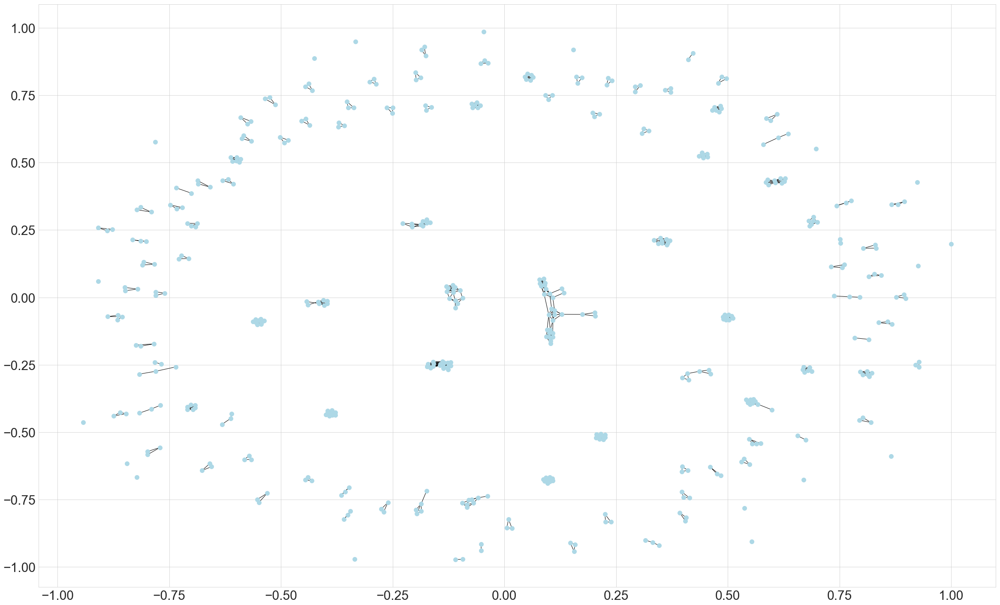

In [21]:
# Show the 'social' relationship of every feature
import networkx as nx

plt.figure(figsize=(40,25))

np.random.seed(1)   #Set seed for reproducing.
G = nx.Graph()
G.add_nodes_from(adj.columns)
G.add_edges_from(edges)
nx.draw_networkx(G, node_color='lightblue', with_labels=False, node_size=100, arrows=False,cmap='YlGnBu')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

The degree of a node means how many nodes are linked with the node. e.g. node A is linked with node B, C and D. The degree of node A is 3. A higher degree indicates the node are linked with more nodes or in other words, it has higher influence on other nodes. In our case, I propose a higher degree means the feature is more important.

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140., 160.]),
 <a list of 9 Text yticklabel objects>)

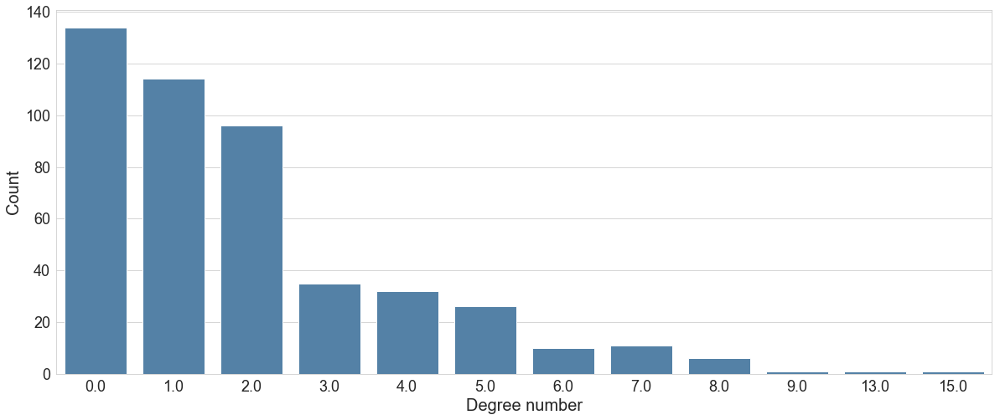

In [22]:
# Calculate the degree of each node
degree = adj.sum(axis=1)

plt.figure(figsize=(20,8))
sns.countplot(degree, color='steelblue')
plt.xlabel('Degree number', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

Drop the nodes with highest degree, until all nodes are of degree 0

In [23]:
# Drop the features 
X_tmp = X_var
while degree.max()!=0:
    to_drop = [column for column in adj.columns if degree[column]==degree.max()]
    print('There are %d columns to remove.' % (len(to_drop))) # The number of features to drop.
    print(f'Columns with high correlations: {to_drop}')
    X_tmp = X_tmp.drop(columns=to_drop)
    corr_tmp = X_tmp.corr()
    #Recalculate the correlation and degree.
    adj = corr_tmp.where(np.triu(np.ones(corr_tmp.shape), k=1).astype(np.bool))
    for i in range(0,adj.shape[0]):
        for j in range(i+1,adj.shape[0]):
            if abs(adj.ix[i,j])>threshold:
                adj.ix[i,j]=1
            else:
                adj.ix[i,j]=0
    degree = adj.sum(axis=1)

There are 1 columns to remove.
Columns with high correlations: ['f_x_SD_x_ROA1_l10_indadj1']
There are 1 columns to remove.
Columns with high correlations: ['f_x_SD_x_ROA1_l10_indadj2']
There are 1 columns to remove.
Columns with high correlations: ['f_x_CV_revt_l10_indadj1']
There are 6 columns to remove.
Columns with high correlations: ['f_x_ROA1', 'f_x_AR_turnover_5yd', 'f_x_CashRatio_5yd', 'f_x_FixedChargeCov_5yd', 'f_x_CurrentRatio', 'f_x_FixedChargeCov']
There are 10 columns to remove.
Columns with high correlations: ['f_x_Sale_fixed_5yd', 'f_x_Asset_grow_5yd', 'f_x_CF_Dltt_5yd', 'f_x_ROA5_indadj1_5yd', 'f_x_QuickRatio_5yd', 'f_x_Intcov2_5yd', 'f_x_Sale_fixed_indadj1', 'f_x_SD_x_ROA1_l10', 'f_x_IntCov1', 'f_x_CashRatio_indadj2']
There are 8 columns to remove.
Columns with high correlations: ['f_x_Sale_grow_5yd', 'f_x_CF_at_5yd', 'f_x_CurrentRatio_5yd', 'f_x_IntCov1_5yd', 'f_x_lev2', 'f_x_QuickRatio_indadj2', 'f_x_FixedChargeCov_indadj2', 'f_x_LogE_indadj1']
There are 28 columns t

In [24]:
print(X_tmp.shape)
X_tmp.to_csv('X_tmp_focal.csv', index=False)

(9664, 135)


## Stepwise Regression

In [25]:
import stepwise_selection as sr
X_var1=pd.read_csv('X_tmp_focal.csv')

result = sr.stepwise_selection(X_var1, np.array(y))

print('Focal firm variable selection result :', result)

# Supply chain variables

In [6]:
# Extract data with supply information.
df_sup = df.filter(regex='s_x|c_x|f_x')
df_sup.shape

(9664, 1455)

In [7]:
# Extract data without supply information.
df_base = df.filter(regex='f_x')
df_base.shape

(9664, 485)

In [8]:
X_base = df_1.filter(regex='f_x')      # Features without supply information.

X_sup = df.filter(regex='s_x|c_x')    # Features with supply information.

y = df['rating_code']

X_var = X_sup

# High Correlation

In [12]:
x_corr = X_var.corr()
plt.figure(figsize=(200,200))
sns.heatmap(x_corr, cmap="YlGnBu")

In [13]:
threshold = 0.8

# I use the concept of  adjacent matrix from social network to deal with the correlation matrix.
adj = x_corr.where(np.triu(np.ones(x_corr.shape), k=1).astype(np.bool))
for i in range(0,adj.shape[0]):
    for j in range(i+1,adj.shape[0]):
        if abs(adj.ix[i,j])>threshold:
            adj.ix[i,j]=1
        else:
            adj.ix[i,j]=0

In [14]:
# Build edges
edges = [('c_x_ROA1','c_x_ROA1')]
for col in adj.columns:
    for row in adj.index:
        if adj.loc[row,col]==1:
            edges.append((row,col))

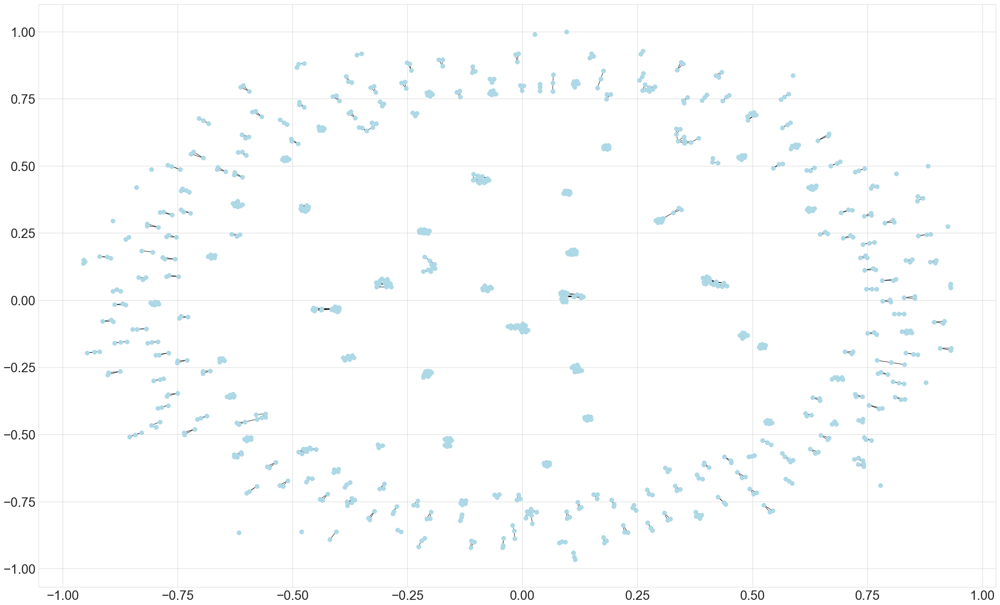

In [15]:
# Show the 'social' relationship of every feature
import networkx as nx

plt.figure(figsize=(40,25))

np.random.seed(1)   #Set seed for reproducing.
G = nx.Graph()
G.add_nodes_from(adj.columns)
G.add_edges_from(edges)
nx.draw_networkx(G, node_color='lightblue', with_labels=False, node_size=100, arrows=False,cmap='YlGnBu')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

(array([  0.,  50., 100., 150., 200., 250., 300.]),
 <a list of 7 Text yticklabel objects>)

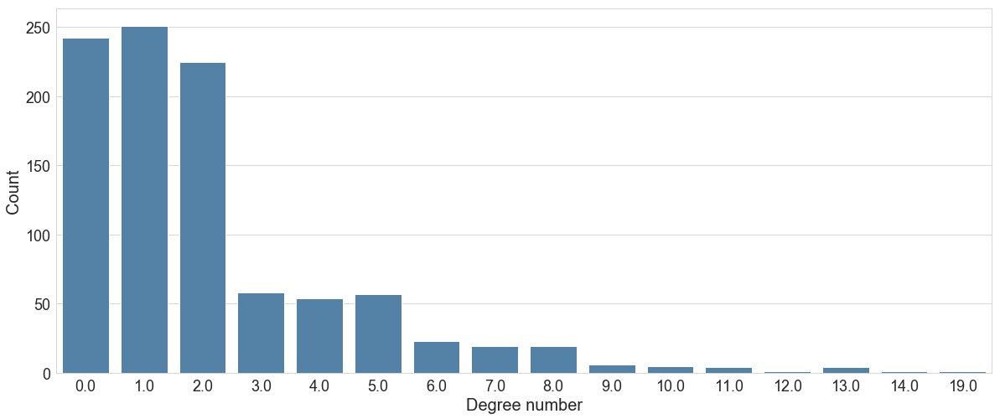

In [16]:
# Calculate the degree of each node
degree = adj.sum(axis=1)

plt.figure(figsize=(20,8))
sns.countplot(degree, color='steelblue')
plt.xlabel('Degree number', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

In [17]:
# Drop the features 
X_tmp = X_var
while degree.max()!=0:
    to_drop = [column for column in adj.columns if degree[column]==degree.max()]
    print('There are %d columns to remove.' % (len(to_drop))) # The number of features to drop.
    print(f'Columns with high correlations: {to_drop}')
    X_tmp = X_tmp.drop(columns=to_drop)
    corr_tmp = X_tmp.corr()
    #Recalculate the correlation and degree.
    adj = corr_tmp.where(np.triu(np.ones(corr_tmp.shape), k=1).astype(np.bool))
    for i in range(0,adj.shape[0]):
        for j in range(i+1,adj.shape[0]):
            if abs(adj.ix[i,j])>threshold:
                adj.ix[i,j]=1
            else:
                adj.ix[i,j]=0
    degree = adj.sum(axis=1)

There are 1 columns to remove.
Columns with high correlations: ['s_x_SD_x_ROA1_l10_indadj1']
There are 1 columns to remove.
Columns with high correlations: ['s_x_LogSize1_indadj1']
There are 4 columns to remove.
Columns with high correlations: ['s_x_MV_dltt_indadj2', 's_x_LogSize1_indadj2', 's_x_SD_x_ROA1_l10_indadj2', 'c_x_LogSize1_indadj2']
There are 1 columns to remove.
Columns with high correlations: ['c_x_CV_revt_l10']
There are 3 columns to remove.
Columns with high correlations: ['s_x_LogSize2_indadj2', 's_x_IntCov1_indadj2', 'c_x_LogSize2_indadj2']
There are 4 columns to remove.
Columns with high correlations: ['s_x_Intcov2_indadj2', 's_x_CF_Dltt_indadj2', 'c_x_Intcov2_indadj2', 'c_x_SD_x_ROA1_l10']
There are 5 columns to remove.
Columns with high correlations: ['c_x_ROA1', 's_x_LogSize3_indadj2', 's_x_CV_x_ROA1_l10_indadj1', 's_x_CF_at_indadj1', 'c_x_LogSize1_indadj1']
There are 20 columns to remove.
Columns with high correlations: ['s_x_Dlc_Dltt_indadj2', 's_x_CurrentRatio_in

There are 252 columns to remove.
Columns with high correlations: ['s_x_D_E_indadj2', 's_x_DefferedTax_dltt_indadj2', 's_x_Dbt_cash_indadj2', 's_x_Re_at_indadj2', 's_x_LogDebt_indadj2', 's_x_EquityRatio2_indadj1', 's_x_CV_x_Ret_l10_indadj2', 's_x_lev5_indadj1', 's_x_lev5_indadj2', 's_x_Indebtedness_indadj2', 's_x_NetIndebt_indadj1', 's_x_EquityRatio1_indadj1', 's_x_Asset_grow_indadj2', 's_x_Equity_grow_indadj2', 's_x_D_grow_indadj2', 's_x_Cash_grow_indadj2', 's_x_AT_turnover_indadj1', 's_x_AT_turnover_indadj2', 's_x_AR_turnover_indadj2', 's_x_E_turnover_indadj2', 's_x_Inv_turnover2_indadj1', 's_x_WC_turnover_indadj2', 's_x_Sale_grow_indadj1', 's_x_M_B_indadj1', 's_x_CF_inv_indadj2', 's_x_CashandEquiv_indadj2', 's_x_D_EBITDA_indadj2', 's_x_NWC_sale_indadj2', 's_x_NWC_at_indadj2', 's_x_LogIntExp_indadj2', 's_x_FixedRatio_indadj2', 's_x_Fixed_indadj1', 's_x_FCF_Dltt_indadj2', 's_x_Int_sale_indadj2', 's_x_lev2', 's_x_DefferedTax_dltt', 's_x_QuickRatio', 's_x_SD_ebit_l10', 'c_x_Sale_fixed_in

In [18]:
print(X_tmp.shape)
X_tmp.to_csv('X_tmp_sc.csv', index=False)

(9664, 249)


# Stepwise Regression

In [ ]:
import stepwise_selection as sr
X_var1=pd.read_csv('X_tmp_sc.csv')

result = sr.stepwise_selection(X_var1, np.array(y))

print('Supply chain firm variable selection result :', result)

# Model Comparison

# Focal only

In this notebook, I'll try to use different models like ordinal logistic regression, OMSVM, random forest and lightGBM. The training data is the whole dataset and in the cross validation process, I use 5 fold Leave one out cross validation.

First thing first, for this ordinal classification problem, I'll define a class -- OrdinalClassifier , inspired by https://towardsdatascience.com/simple-trick-to-train-an-ordinal-regression-with-any-classifier-6911183d2a3c.

In [2]:
from sklearn.base import clone


class OrdinalClassifier():
    
    def __init__(self, clf):
        self.clf = clf
        self.clfs = {}
    
    def fit(self, X, y):
        self.unique_class = np.sort(np.unique(y))
        if self.unique_class.shape[0] > 2:
            for i in range(self.unique_class.shape[0]-1):
                # for each k - 1 ordinal value we fit a binary classification problem
                binary_y = (y > self.unique_class[i]).astype(np.uint8)
                clf = clone(self.clf)
                clf.fit(X, binary_y)
                self.clfs[i] = clf
        return self.clfs
    
def Ordinal_predict_proba(Ordinal_fit, X, unique_class):
    clfs_predict = {k:Ordinal_fit[k].predict_proba(X) for k in Ordinal_fit}
    predicted = []
    for i,y in enumerate(unique_class):
        if i == 0:
            # V1 = 1 - Pr(y > V1)
            predicted.append(1 - clfs_predict[y][:,1])
        elif y in clfs_predict:
            # Vi = Pr(y > Vi-1) - Pr(y > Vi)
            predicted.append(clfs_predict[y-1][:,1] - clfs_predict[y][:,1])
        else:
            # Vk = Pr(y > Vk-1)
            predicted.append(clfs_predict[y-1][:,1])
    return np.vstack(predicted).T
    
def Ordinal_predict(Ordinal_predict_proba):
    return np.argmax(Ordinal_predict_proba, axis=1)

In [3]:
# Define Cross Validation function. Use accuracy as the criteria.
from sklearn.model_selection import KFold, StratifiedKFold
from sklearn.svm import SVC

def cv_acc(model, x, y):
    skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=False)
    unique_class = np.sort(np.unique(y))
    acc = []
    for train_index, test_index in skf.split(x,y):
        X_train,X_test=np.array(X)[train_index],np.array(X)[test_index]
        y_train,y_test=y[train_index],y[test_index]
        # Fit the model.
        if model == SVC:
            clf = OrdinalClassifier(model(probability=True)).fit(X_train, y_train)
        else:
            clf = OrdinalClassifier(model()).fit(X_train, y_train)
        # Test on the test set.
        pred_proba = Ordinal_predict_proba(clf, X_test, unique_class)
        pred = Ordinal_predict(pred_proba)
        acc.append(np.count_nonzero(pred-y_test)/len(y_test))
    return(np.mean(acc))

def cv_within_acc(model, x, y):
    skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=False)
    unique_class = np.sort(np.unique(y))
    acc = []
    for train_index, test_index in skf.split(x,y):
        X_train,X_test=np.array(X)[train_index],np.array(X)[test_index]
        y_train,y_test=y[train_index],y[test_index]
        # Fit the model.
        if model == SVC:
            clf = OrdinalClassifier(model(probability=True)).fit(X_train, y_train)
        else:
            clf = OrdinalClassifier(model()).fit(X_train, y_train)
        # Test on the test set.
        pred_proba = Ordinal_predict_proba(clf, X_test, unique_class)
        pred = Ordinal_predict(pred_proba)
        AR = 0
        within_acc = []
        for i in range(len(pred)):
            if abs(pred[i]-y[i])>1:
                AR = AR+1
        within_acc.append(AR/len(y))
    return(np.mean(within_acc))

In [4]:
# Define feature importance function for lgb and random forest
def feat_imp(Ordinal_fit):
    imp = pd.DataFrame({k:Ordinal_fit[k].feature_importances_ for k in Ordinal_fit})
    return(imp.mean(axis=1))

# Load data

In [5]:
df = pd.read_csv('df_model.csv')
X = df.drop(['rgroup_code', 'rating_code'], axis=1)
y = df['rgroup_code']
unique_class = np.sort(np.unique(y))

# Ordinal Logistic

In [6]:
from sklearn.linear_model import LogisticRegression

olog = OrdinalClassifier(LogisticRegression()).fit(X, y)

In [7]:
pred_proba = Ordinal_predict_proba(olog, X,unique_class)

In [8]:
pred = Ordinal_predict(pred_proba)
pred

array([3, 2, 2, ..., 2, 2, 1])

In [9]:
np.count_nonzero(pred-y)/len(y) # Training error.

0.42042632450331124

In [10]:
# Cross Validation
olog_AR = 1-cv_acc(LogisticRegression, X, y)
olog_within_AR = 1-cv_within_acc(LogisticRegression, X, y)
print(olog_AR)
print(olog_within_AR)

0.5731812234368686
0.9348096026490066


# OSVM

In [11]:
from sklearn.svm import SVC

osvm = OrdinalClassifier(SVC(probability=True)).fit(X, y)

In [12]:
pred_proba1 = Ordinal_predict_proba(osvm, X,unique_class)
pred1 = Ordinal_predict(pred_proba1)
pred1

array([3, 3, 2, ..., 2, 2, 1])

In [13]:
np.count_nonzero(pred1-y)/len(y)

0.2731788079470199

In [16]:
# Within one notch AR
AR = 0
for i in range(len(pred1)):
    if abs(pred[i]-y[i])<1:
        AR = AR+1

AR/len(y)

0.5795736754966887

In [15]:
# Cross Validation
osvm_AR = 1-cv_acc(SVC, X, y)
osvm_within_AR = 1-cv_within_acc(SVC, X, y)
print(osvm_AR)
print(osvm_within_AR)

0.6194415722154201
0.9371895695364238


# LightGBM

In [17]:
from lightgbm import LGBMClassifier
import os
os.environ["KMP_DUPLICATE_LIB_OK"]='TRUE'
olgb = OrdinalClassifier(LGBMClassifier()).fit(X, y)

In [18]:
pred_proba2 = Ordinal_predict_proba(olgb, X,unique_class)
pred2 = Ordinal_predict(pred_proba2)
pred2

array([4, 4, 2, ..., 2, 3, 0])

In [19]:
np.count_nonzero(pred2-y)/len(y)

0.0345612582781457

In [20]:
# Cross Validation
olgb_AR = 1-cv_acc(LGBMClassifier, X, y)
olgb_within_AR = 1-cv_within_acc(LGBMClassifier, X, y)
print(olgb_AR)
print(olgb_within_AR)

0.7173451668710322
0.9351200331125827


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text yticklabel objects>)

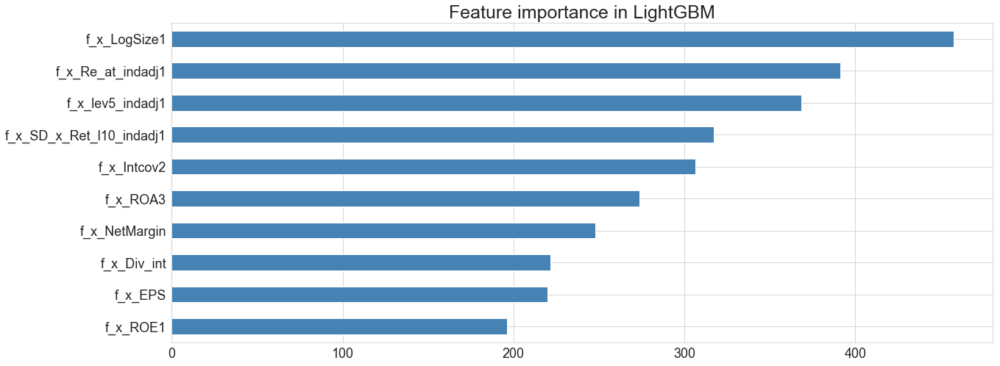

In [25]:
olgb_imp = feat_imp(olgb)
olgb_imp.index = X.columns
olgb_imp = olgb_imp.sort_values()

plt.figure(figsize=(20,8))
olgb_imp.plot(kind='barh', color='steelblue')
plt.title('Feature importance in LightGBM', fontsize=25)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Random Forest

In [26]:
from sklearn.ensemble import RandomForestClassifier

orf = OrdinalClassifier(RandomForestClassifier()).fit(X, y)

In [27]:
pred_proba3 = Ordinal_predict_proba(orf, X,unique_class)
pred3 = Ordinal_predict(pred_proba3)
pred3

array([4, 4, 2, ..., 2, 3, 0])

In [28]:
np.count_nonzero(pred3-y)/len(y)

0.007657284768211921

In [29]:
# Cross Validation
orf_AR = 1-cv_acc(RandomForestClassifier, X, y)
orf_within_AR = 1-cv_within_acc(RandomForestClassifier, X, y)
print(orf_AR)
print(orf_within_AR)

0.6985149021941748
0.9321192052980133


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text yticklabel objects>)

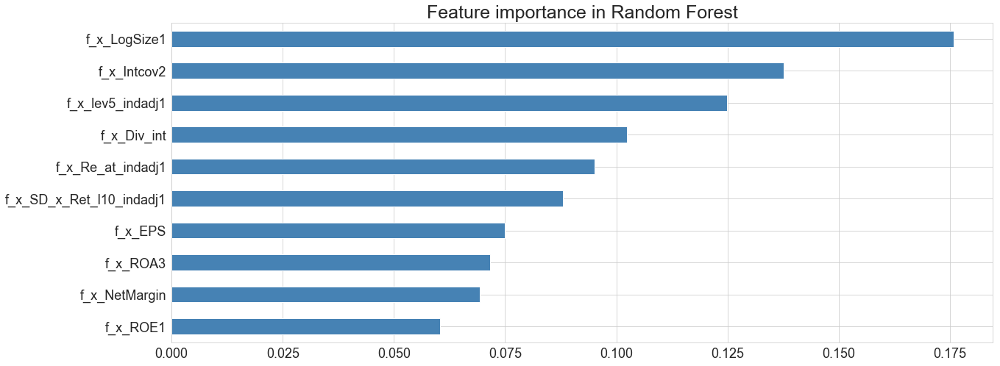

In [30]:
orf_imp = feat_imp(orf)
orf_imp.index = X.columns
orf_imp = orf_imp.sort_values()

plt.figure(figsize=(20,8))
orf_imp.plot(kind='barh', color='steelblue')
plt.title('Feature importance in Random Forest', fontsize=25)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Neural Network (Multi-layer perceptron)

In [31]:
from sklearn.neural_network import MLPClassifier

omlp = OrdinalClassifier(MLPClassifier()).fit(X, y)

In [32]:
pred_proba4 = Ordinal_predict_proba(omlp, X,unique_class)
pred4 = Ordinal_predict(pred_proba4)
pred4

array([3, 3, 2, ..., 3, 2, 1])

In [33]:
np.count_nonzero(pred4-y)/len(y)

0.3391970198675497

In [34]:
# Cross Validation
omlp_AR = 1-cv_acc(MLPClassifier, X, y)
omlp_within_AR = 1-cv_within_acc(MLPClassifier, X, y)
print(omlp_AR)
print(omlp_within_AR)

0.621499504459655
0.9359478476821192


# All the variables
Compared with data with all f_ variables

In [26]:
#df = pd.read_csv('rating_sc0801.csv')

#df_base = df.drop(list(df.filter(regex='s_|c_')), axis=1)
#X_var = df_base.filter(regex='f_')
#X_var = X_var.drop(['f_cusip'], axis=1)

In [27]:
#osvm1 = OrdinalClassifier(SVC(probability=True)).fit(X_var, y)
#pred_proba_svm = Ordinal_predict_proba(osvm1, X_var,unique_class)
#pred_svm = Ordinal_predict(pred_proba_svm)
#pred_svm

In [28]:
#np.count_nonzero(pred_svm-y)/len(y)

In [29]:
#cv_acc(SVC, X_var, y)

# Conclusion

In [36]:
# All the models are ordinal. So I just use the name logistic rather than ologit.
exact_AR = pd.Series(data=[olog_AR, osvm_AR, olgb_AR, orf_AR, omlp_AR], 
                     index=['Logistic', 'SVM', 'LightGBM', 'RandomForest', 'Neural Network'])
exact_within_AR = pd.Series(data=[olog_within_AR, osvm_within_AR, olgb_within_AR, 
                                  orf_within_AR, omlp_within_AR], 
                            index=['Logistic', 'SVM', 'LightGBM', 'RandomForest', 'Neural Network'])

Text(0, 0.5, 'Within one notch AR')

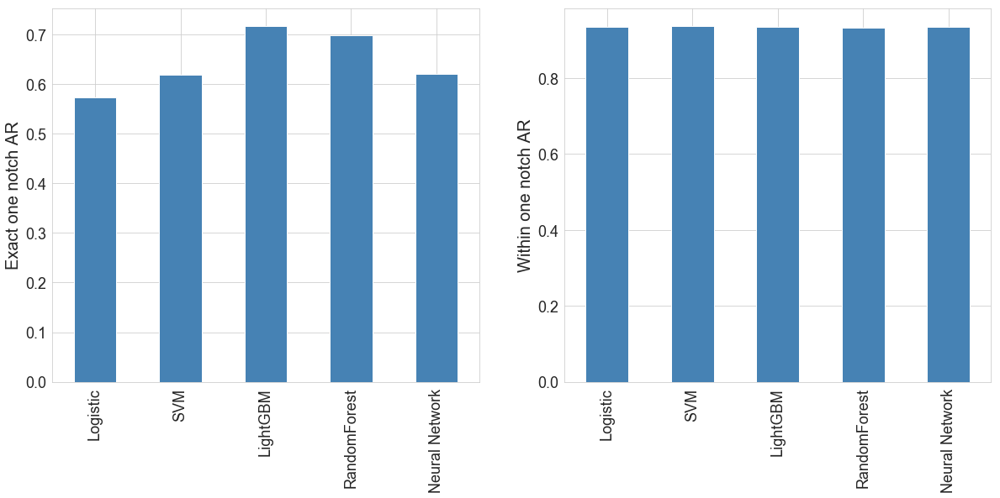

In [41]:
plt.figure(figsize=(20,18))
plt.subplot(221)
exact_AR.plot(kind='bar', color='steelblue')
plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Exact one notch AR', fontsize=20)
plt.subplot(222)
exact_within_AR.plot(kind='bar', color='steelblue')
plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Within one notch AR', fontsize=20)

# Supply chain only

# Load data

In [6]:
df = pd.read_csv('df_model_sc.csv')
X = df.drop(['rgroup_code', 'rating_code'], axis=1)
y = df['rgroup_code']
unique_class = np.sort(np.unique(y))

# Ordinal Logistic

In [7]:
from sklearn.linear_model import LogisticRegression

olog = OrdinalClassifier(LogisticRegression()).fit(X, y)

In [8]:
pred_proba = Ordinal_predict_proba(olog, X,unique_class)

In [9]:
pred = Ordinal_predict(pred_proba)
pred

array([3, 3, 3, ..., 2, 2, 2])

In [10]:
np.count_nonzero(pred-y)/len(y) # Training error.

0.6351407284768212

In [11]:
# Cross Validation
olog_AR = 1-cv_acc(LogisticRegression, X, y)
olog_within_AR = 1-cv_within_acc(LogisticRegression, X, y)
print(olog_AR)
print(olog_within_AR)

0.3487206666433845
0.9480546357615894


# OSVM

In [12]:
from sklearn.svm import SVC

osvm = OrdinalClassifier(SVC(probability=True)).fit(X, y)

In [13]:
pred_proba1 = Ordinal_predict_proba(osvm, X,unique_class)
pred1 = Ordinal_predict(pred_proba1)
pred1

array([3, 3, 2, ..., 2, 2, 2])

In [14]:
np.count_nonzero(pred1-y)/len(y)

0.2115066225165563

In [15]:
# Within one notch AR
AR = 0
for i in range(len(pred1)):
    if abs(pred[i]-y[i])>1:
        AR = AR+1

AR/len(y)

0.19360513245033112

In [16]:
# Cross Validation
osvm_AR = 1-cv_acc(SVC, X, y)
osvm_within_AR = 1-cv_within_acc(SVC, X, y)
print(osvm_AR)
print(osvm_within_AR)

0.3944613006591915
0.9422599337748344


# LightGBM

In [17]:
from lightgbm import LGBMClassifier
import os
os.environ['KMP_DUPLICATE_LIB_OK']='TRUE'
olgb = OrdinalClassifier(LGBMClassifier()).fit(X, y)

In [18]:
pred_proba2 = Ordinal_predict_proba(olgb, X,unique_class)
pred2 = Ordinal_predict(pred_proba2)
pred2

array([4, 4, 2, ..., 2, 3, 0])

In [19]:
np.count_nonzero(pred2-y)/len(y)

0.12841473509933773

In [20]:
# Cross Validation
olgb_AR = 1-cv_acc(LGBMClassifier, X, y)
olgb_within_AR = 1-cv_within_acc(LGBMClassifier, X, y)
print(olgb_AR)
print(olgb_within_AR)

0.4473508318490578
0.9392591059602649


Text(0.5, 1.0, 'Feature importance in LightGBM')

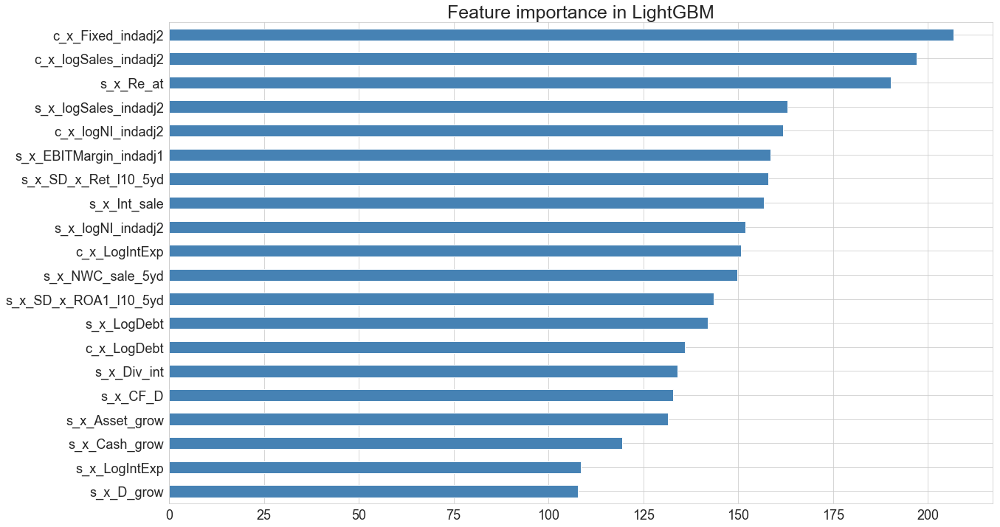

In [22]:
olgb_imp = feat_imp(olgb)
olgb_imp.index = X.columns
olgb_imp = olgb_imp.sort_values()

plt.figure(figsize=(20,12))
olgb_imp.plot(kind='barh', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.title('Feature importance in LightGBM', fontsize=25)

# Random Forest

In [23]:
from sklearn.ensemble import RandomForestClassifier

orf = OrdinalClassifier(RandomForestClassifier()).fit(X, y)

In [24]:
pred_proba3 = Ordinal_predict_proba(orf, X,unique_class)
pred3 = Ordinal_predict(pred_proba3)
pred3

array([4, 4, 2, ..., 2, 3, 1])

In [25]:
np.count_nonzero(pred3-y)/len(y)

0.018211920529801324

In [26]:
# Cross Validation
orf_AR = 1-cv_acc(RandomForestClassifier, X, y)
orf_within_AR = 1-cv_within_acc(RandomForestClassifier, X, y)
print(orf_AR)
print(orf_within_AR)

0.4108372603478585
0.9357408940397351


Text(0.5, 1.0, 'Feature importance in Random Forest')

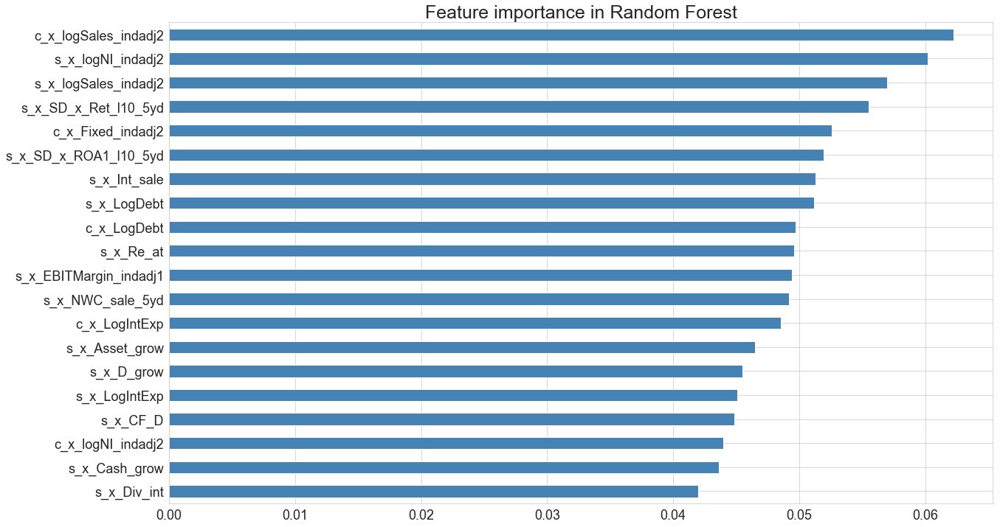

In [27]:
orf_imp = feat_imp(orf)
orf_imp.index = X.columns
orf_imp = orf_imp.sort_values()

plt.figure(figsize=(20,12))
orf_imp.plot(kind='barh', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.title('Feature importance in Random Forest', fontsize=25)

# Neural Network(Multi-layer perceptron)

In [28]:
from sklearn.neural_network import MLPClassifier

omlp = OrdinalClassifier(MLPClassifier()).fit(X, y)

In [29]:
pred_proba4 = Ordinal_predict_proba(omlp, X,unique_class)
pred4 = Ordinal_predict(pred_proba4)
pred4

array([3, 4, 2, ..., 3, 1, 1])

In [30]:
np.count_nonzero(pred4-y)/len(y)

0.42591059602649006

In [31]:
# Cross Validation
omlp_AR = 1-cv_acc(MLPClassifier, X, y)
omlp_within_AR = 1-cv_within_acc(MLPClassifier, X, y)
print(omlp_AR)
print(omlp_within_AR)

0.37191229521084146
0.9377069536423841


# Conclusion

In [33]:
# All the models are ordinal. So I just use the name logistic rather than ologit.
exact_AR = pd.Series(data=[olog_AR, osvm_AR, olgb_AR, orf_AR, omlp_AR], 
                     index=['Logistic', 'SVM', 'LightGBM', 'RandomForest', 'Neural Network'])
exact_within_AR = pd.Series(data=[olog_within_AR, osvm_within_AR, 
                                  olgb_within_AR, orf_within_AR, omlp_within_AR], 
                            index=['Logistic', 'SVM', 'LightGBM', 'RandomForest', 'Neural Network'])

Text(0, 0.5, 'Within one notch AR')

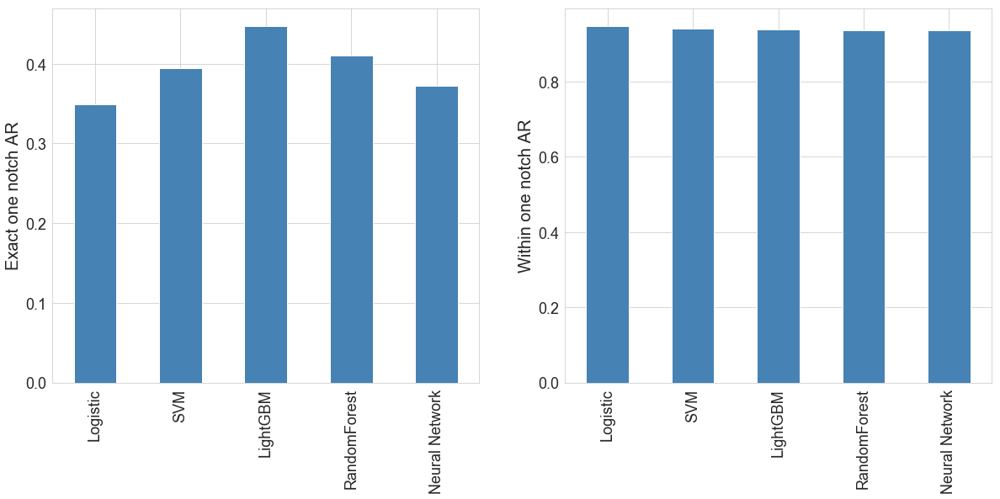

In [34]:
plt.figure(figsize=(20,18))
plt.subplot(221)
exact_AR.plot(kind='bar', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Exact one notch AR', fontsize=20)
plt.subplot(222)
exact_within_AR.plot(kind='bar', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Within one notch AR', fontsize=20)

# Focal and Supply chain

# Load data

In [5]:
df = pd.read_csv('df_model_fsc.csv')
X = df.drop(['rgroup_code', 'rating_code'], axis=1)
y = df['rgroup_code']
unique_class = np.sort(np.unique(y))

# Ordinal Logistic

In [6]:
from sklearn.linear_model import LogisticRegression

olog = OrdinalClassifier(LogisticRegression()).fit(X, y)

In [7]:
pred_proba = Ordinal_predict_proba(olog, X,unique_class)

In [8]:
pred = Ordinal_predict(pred_proba)
pred

array([3, 3, 2, ..., 2, 2, 0])

In [9]:
np.count_nonzero(pred-y)/len(y) # Training error.

0.39331539735099336

In [10]:
# Cross Validation
olog_AR = 1-cv_acc(LogisticRegression, X, y)
olog_within_AR = 1-cv_within_acc(LogisticRegression, X, y)
print(olog_AR)
print(olog_within_AR)

0.5896335734718516
0.9352235099337748


# OSVM

In [11]:
from sklearn.svm import SVC

osvm = OrdinalClassifier(SVC(probability=True)).fit(X, y)

In [12]:
pred_proba1 = Ordinal_predict_proba(osvm, X,unique_class)
pred1 = Ordinal_predict(pred_proba1)
pred1

array([4, 4, 2, ..., 2, 3, 0])

In [13]:
np.count_nonzero(pred1-y)/len(y)

0.04542632450331126

In [14]:
# Within one notch AR
AR = 0
for i in range(len(pred1)):
    if abs(pred[i]-y[i])>1:
        AR = AR+1

AR/len(y)

0.032388245033112585

In [15]:
# Cross Validation
osvm_AR = 1-cv_acc(SVC, X, y)
osvm_within_AR = 1-cv_within_acc(SVC, X, y)
print(osvm_AR)
print(osvm_within_AR)

0.507589353921929
0.9385347682119205


# LightGBM

In [16]:
from lightgbm import LGBMClassifier
import os
os.environ['KMP_DUPLICATE_LIB_OK']='TRUE'
olgb = OrdinalClassifier(LGBMClassifier()).fit(X, y)

In [17]:
pred_proba2 = Ordinal_predict_proba(olgb, X,unique_class)
pred2 = Ordinal_predict(pred_proba2)
pred2

array([4, 4, 2, ..., 2, 3, 0])

In [18]:
np.count_nonzero(pred2-y)/len(y)

0.010037251655629138

In [19]:
# Cross Validation
olgb_AR = 1-cv_acc(LGBMClassifier, X, y)
olgb_within_AR = 1-cv_within_acc(LGBMClassifier, X, y)
print(olgb_AR)
print(olgb_within_AR)

0.7241742045862801
0.9341887417218543


Text(0.5, 1.0, 'Feature importance in LightGBM')

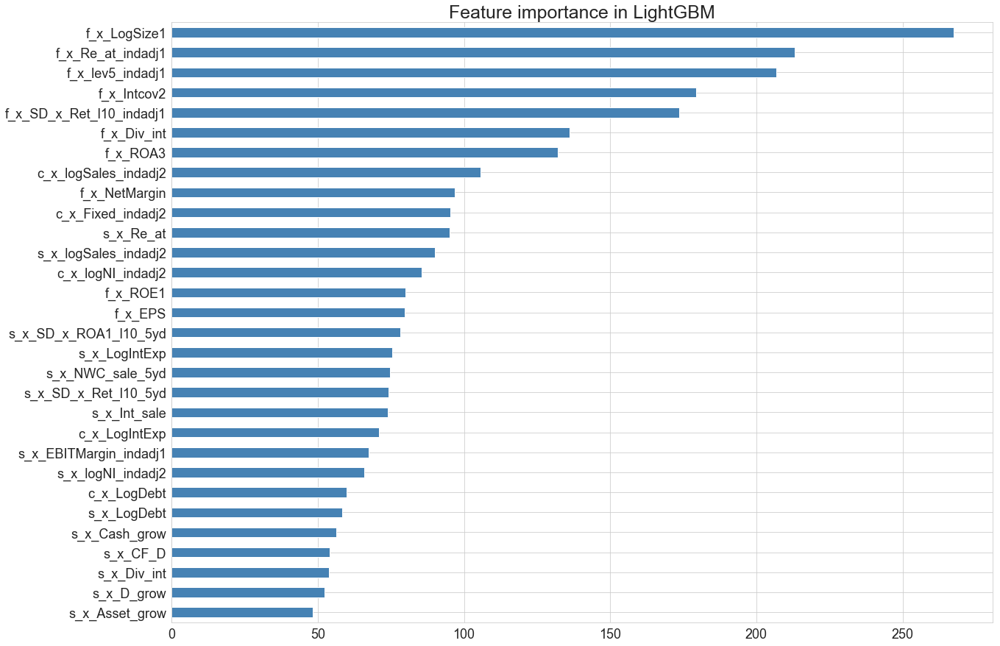

In [23]:
olgb_imp = feat_imp(olgb)
olgb_imp.index = X.columns
olgb_imp = olgb_imp.sort_values()

plt.figure(figsize=(20,15))
olgb_imp.plot(kind='barh', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.title('Feature importance in LightGBM', fontsize=25)

# Random Forest

In [24]:
from sklearn.ensemble import RandomForestClassifier

orf = OrdinalClassifier(RandomForestClassifier()).fit(X, y)

In [25]:
pred_proba3 = Ordinal_predict_proba(orf, X,unique_class)
pred3 = Ordinal_predict(pred_proba3)
pred3

array([4, 4, 2, ..., 2, 3, 0])

In [26]:
np.count_nonzero(pred3-y)/len(y)

0.00941639072847682

In [27]:
# Cross Validation
orf_AR = 1-cv_acc(RandomForestClassifier, X, y)
orf_within_AR = 1-cv_within_acc(RandomForestClassifier, X, y)
print(orf_AR)
print(orf_within_AR)

0.657952619726571
0.9329470198675497


Text(0.5, 1.0, 'Feature importance in Random Forest')

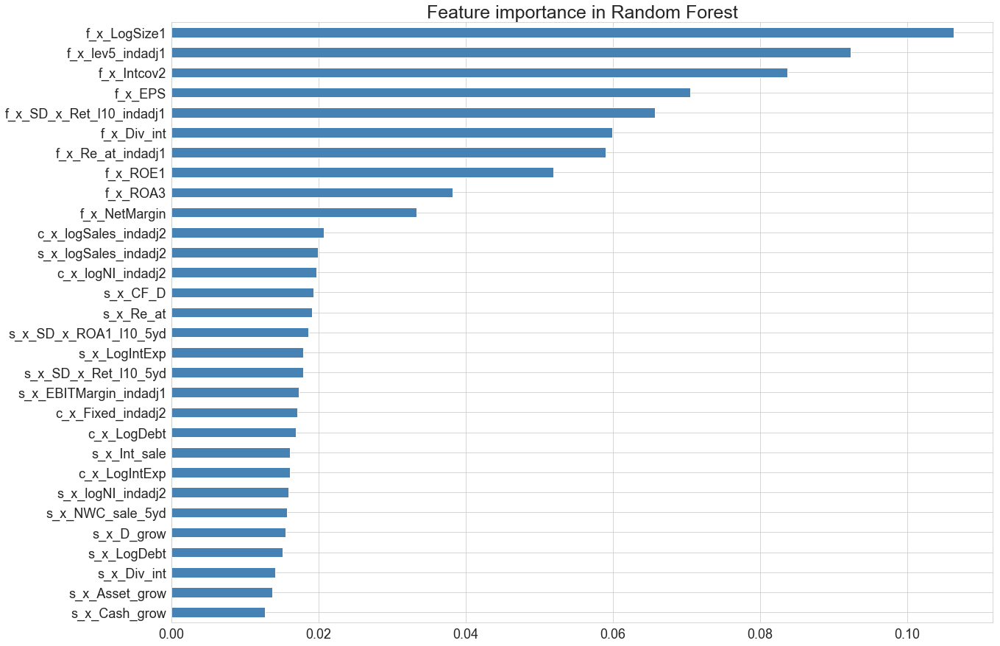

In [29]:
orf_imp = feat_imp(orf)
orf_imp.index = X.columns
orf_imp = orf_imp.sort_values()

plt.figure(figsize=(20,15))
orf_imp.plot(kind='barh', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.title('Feature importance in Random Forest', fontsize=25)

# Neural Network (Multi-layer perceptron)

In [30]:
from sklearn.neural_network import MLPClassifier

omlp = OrdinalClassifier(MLPClassifier()).fit(X, y)

In [31]:
pred_proba4 = Ordinal_predict_proba(omlp, X,unique_class)
pred4 = Ordinal_predict(pred_proba4)
pred4

array([4, 3, 2, ..., 2, 3, 0])

In [32]:
np.count_nonzero(pred4-y)/len(y)

0.21605960264900662

In [33]:
# Cross Validation
omlp_AR = 1-cv_acc(MLPClassifier, X, y)
omlp_within_AR = 1-cv_within_acc(MLPClassifier, X, y)
print(omlp_AR)
print(omlp_within_AR)

0.6137461758524128
0.9324296357615894


# Conclusion

In [34]:
# All the models are ordinal. So I just use the name logistic rather than ologit.
exact_AR = pd.Series(data=[olog_AR, osvm_AR, olgb_AR, orf_AR, omlp_AR], 
                     index=['Logistic', 'SVM', 'LightGBM', 'RandomForest', 'Neural Network'])
exact_within_AR = pd.Series(data=[olog_within_AR, osvm_within_AR, 
                                  olgb_within_AR, orf_within_AR, omlp_within_AR], 
                            index=['Logistic', 'SVM', 'LightGBM', 'RandomForest', 'Neural Network'])

Text(0, 0.5, 'Within one notch AR')

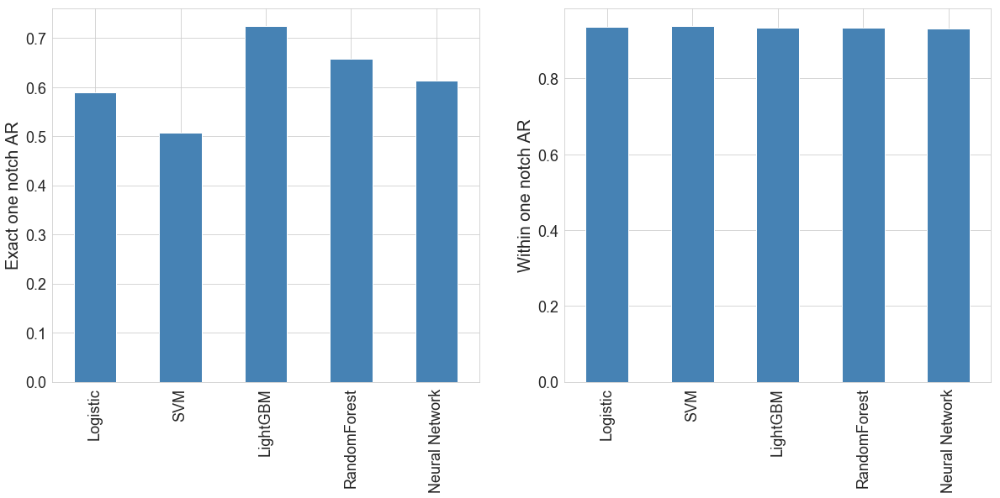

In [36]:
plt.figure(figsize=(20,18))
plt.subplot(221)
exact_AR.plot(kind='bar', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Exact one notch AR', fontsize=20)
plt.subplot(222)
exact_within_AR.plot(kind='bar', color='steelblue')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.ylabel('Within one notch AR', fontsize=20)